In [1]:
!pip install opencv-python
!pip install tensorflow

In [2]:
import cv2
import numpy as np
import glob
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing import image
from tensorflow.keras.optimizers import RMSprop
import os
import matplotlib.pyplot as plt

In [3]:
img = image.load_img("D:/Project 91/training/solar cell not fault/A-Solar-Cell-That-Can-Work-at-Night.png")

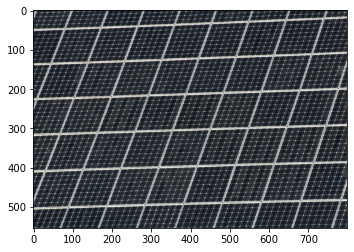

In [4]:
plt.imshow(img)

In [5]:
cv2.imread("D:/Project 91/training/solar cell not fault/A-Solar-Cell-That-Can-Work-at-Night.png")

array([[[ 53,  44,  39],
        [ 57,  49,  45],
        [ 71,  63,  61],
        ...,
        [ 73,  72,  69],
        [ 27,  24,  16],
        [ 35,  28,  20]],

       [[ 51,  44,  33],
        [ 69,  60,  51],
        [ 64,  57,  49],
        ...,
        [ 29,  30,  23],
        [ 30,  29,  20],
        [ 36,  32,  22]],

       [[ 53,  50,  36],
        [ 76,  69,  58],
        [ 59,  50,  41],
        ...,
        [ 21,  21,  16],
        [ 34,  32,  24],
        [ 45,  42,  33]],

       ...,

       [[ 21,  13,   6],
        [ 24,  15,  11],
        [ 36,  27,  23],
        ...,
        [128, 111, 122],
        [129, 128, 122],
        [ 37,  39,  24]],

       [[ 69,  66,  59],
        [ 76,  69,  63],
        [ 86,  76,  72],
        ...,
        [176, 166, 168],
        [ 78,  78,  67],
        [ 37,  35,  24]],

       [[ 39,  34,  28],
        [ 46,  40,  35],
        [ 66,  57,  53],
        ...,
        [172, 167, 167],
        [ 37,  39,  26],
        [ 41,  39,  28]]

In [6]:
cv2.imread("D:/Project 91/training/solar cell not fault/A-Solar-Cell-That-Can-Work-at-Night.png").shape

(554, 800, 3)

In [7]:
training = ImageDataGenerator(rescale=1/53)
validation = ImageDataGenerator(rescale=1/53)

In [8]:
training_dataset = training.flow_from_directory('D:/Project 91/training',
                                             target_size=(200,200),
                                             batch_size=5,
                                             class_mode='binary')

validation_dataset = validation.flow_from_directory('D:/Project 91/validation',
                                             target_size=(200,200),
                                             batch_size=5,
                                             class_mode='binary')

                                             

Found 136 images belonging to 2 classes.
Found 136 images belonging to 2 classes.


In [9]:
training_dataset.class_indices

{'solar cell fault': 0, 'solar cell not fault': 1}

In [10]:
training_dataset.classes

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1])

In [11]:
model = tf.keras.models.Sequential([ tf.keras.layers.Conv2D(16,(3,3),activation = 'relu',input_shape=(200,200,3)),
                                    tf.keras.layers.MaxPool2D(2,2),
                                    #
                                    tf.keras.layers.Conv2D(32,(3,3),activation = 'relu'),
                                    tf.keras.layers.MaxPool2D(2,2),
                                    #
                                    tf.keras.layers.Conv2D(64,(3,3),activation = 'relu'),
                                    tf.keras.layers.MaxPool2D(2,2),
                                    ##
                                    tf.keras.layers.Flatten(),
                                    ##
                                    tf.keras.layers.Dense(512,activation='relu'),
                                    ##
                                    tf.keras.layers.Dense(1,activation='sigmoid'),
                                   ])
                                    

In [12]:
model.compile(loss= 'binary_crossentropy',
             optimizer = RMSprop(lr=0.001),
             metrics =['accuracy'])

D:\New folder\lib\site-packages\keras\optimizer_v2\rmsprop.py:130: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(RMSprop, self).__init__(name, **kwargs)


In [13]:
model_fit = model.fit(training_dataset,
                      steps_per_epoch = 5,
                      epochs=45,
                      validation_data= validation_dataset)

Epoch 1/45
5/5 [==============================] - 3s 582ms/step - loss: 14.2779 - accuracy: 0.5200 - val_loss: 5.8413 - val_accuracy: 0.3529
Epoch 2/45
5/5 [==============================] - 2s 497ms/step - loss: 1.0538 - accuracy: 0.6400 - val_loss: 2.4920 - val_accuracy: 0.4559
Epoch 3/45
5/5 [==============================] - 2s 511ms/step - loss: 1.7109 - accuracy: 0.7200 - val_loss: 0.3430 - val_accuracy: 0.9191
Epoch 4/45
5/5 [==============================] - 2s 462ms/step - loss: 1.0142 - accuracy: 0.6000 - val_loss: 0.2549 - val_accuracy: 0.8750
Epoch 5/45
5/5 [==============================] - 2s 473ms/step - loss: 0.2341 - accuracy: 0.9200 - val_loss: 0.1573 - val_accuracy: 0.9706
Epoch 6/45
5/5 [==============================] - 2s 467ms/step - loss: 0.1142 - accuracy: 1.0000 - val_loss: 0.1958 - val_accuracy: 0.9412
Epoch 7/45
5/5 [==============================] - 2s 468ms/step - loss: 0.1978 - accuracy: 0.9524 - val_loss: 0.1831 - val_accuracy: 0.9338
Epoch 8/45
5/5 [===

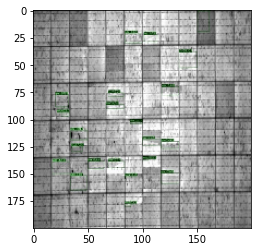

Solar Cell is Fault


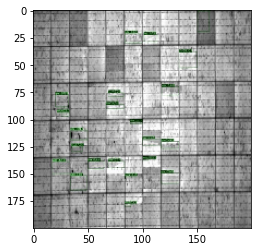

Solar Cell is Fault


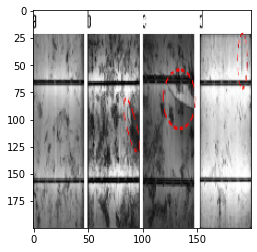

Solar Cell is Fault


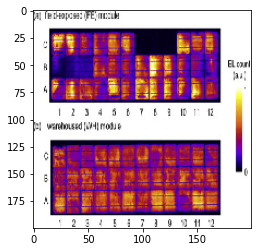

Solar Cell is Fault


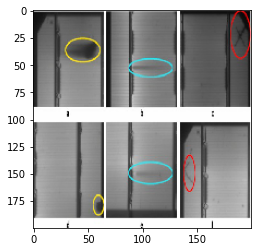

Solar Cell is Fault


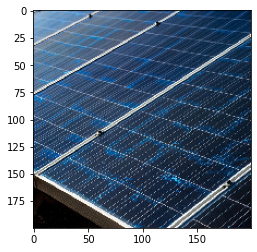

Solar Cell is Not fault


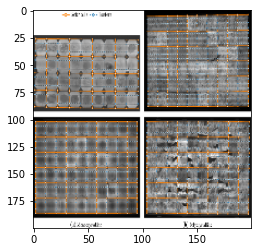

Solar Cell is Fault


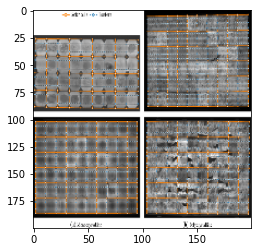

Solar Cell is Fault


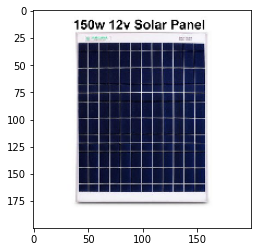

Solar Cell is Not fault


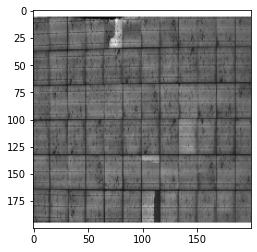

Solar Cell is Fault


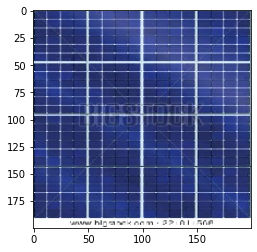

Solar Cell is Not fault


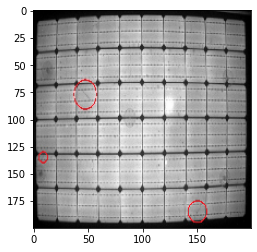

Solar Cell is Fault


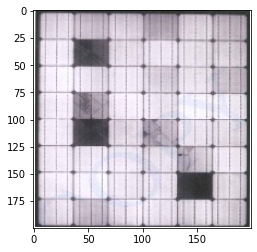

Solar Cell is Fault


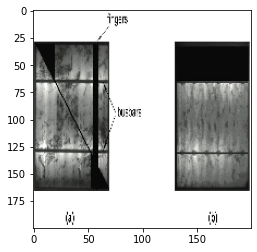

Solar Cell is Fault


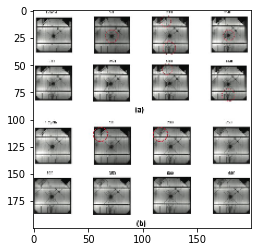

Solar Cell is Fault


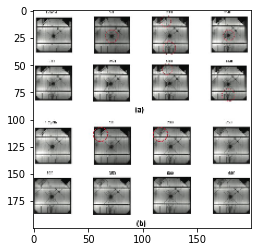

Solar Cell is Fault


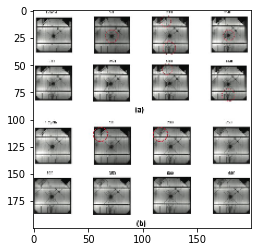

Solar Cell is Fault


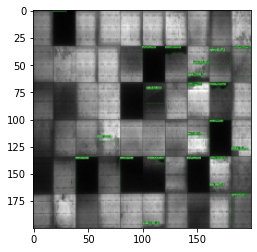

Solar Cell is Fault


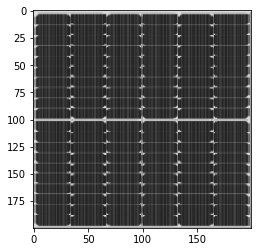

Solar Cell is Not fault


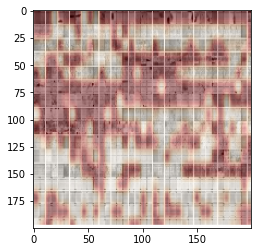

Solar Cell is Fault


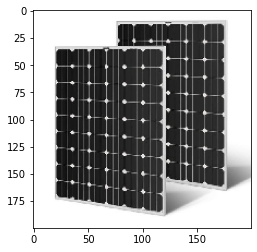

Solar Cell is Fault


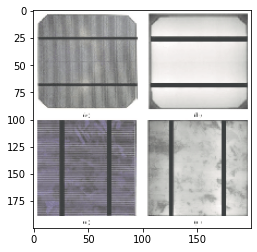

Solar Cell is Fault


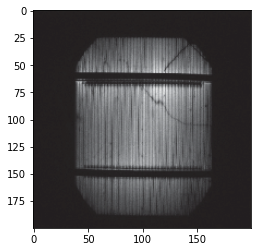

Solar Cell is Fault


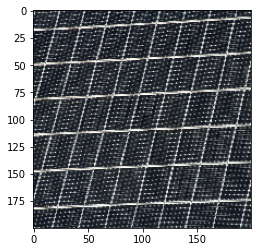

Solar Cell is Fault


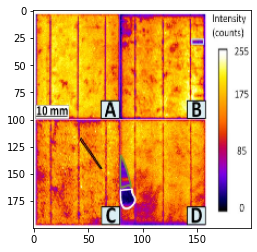

Solar Cell is Fault


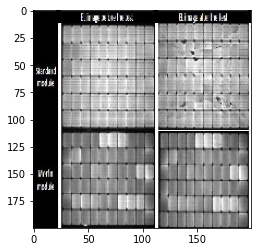

Solar Cell is Fault


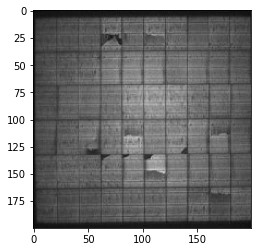

Solar Cell is Fault


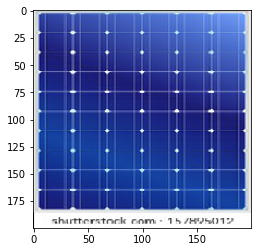

Solar Cell is Not fault


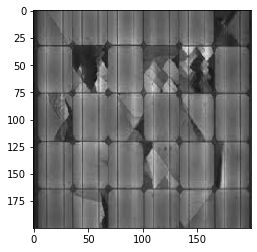

Solar Cell is Fault


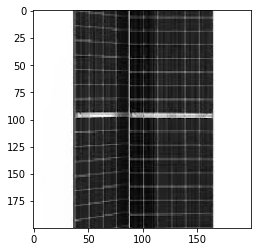

Solar Cell is Not fault


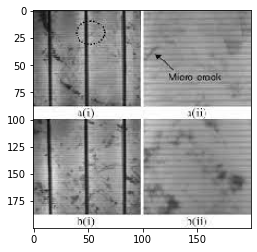

Solar Cell is Fault


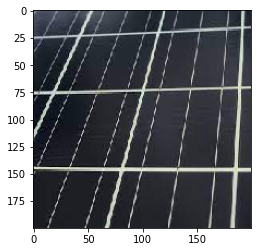

Solar Cell is Not fault


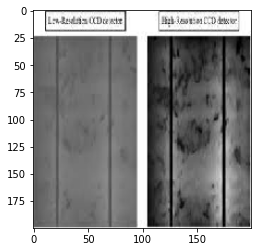

Solar Cell is Fault


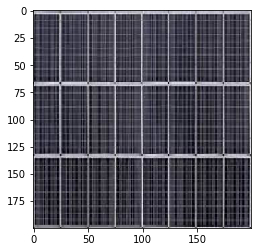

Solar Cell is Not fault


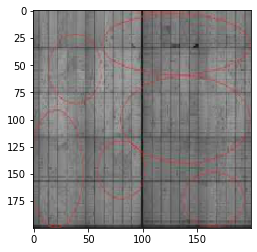

Solar Cell is Fault


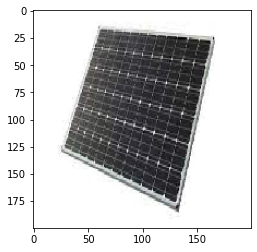

Solar Cell is Not fault


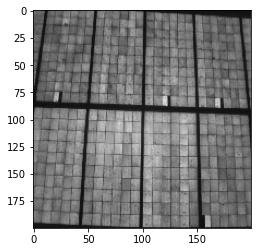

Solar Cell is Fault


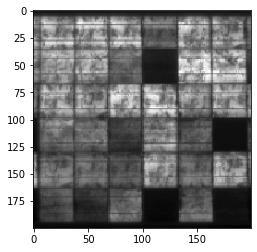

Solar Cell is Fault


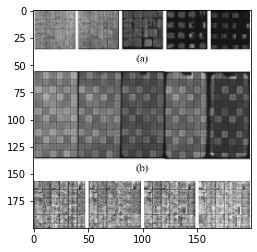

Solar Cell is Fault


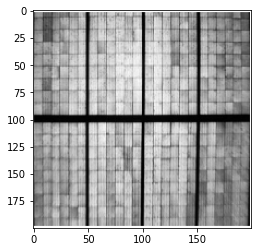

Solar Cell is Fault


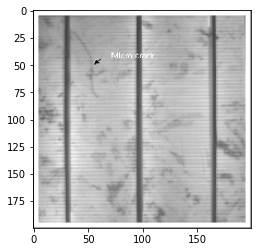

Solar Cell is Fault


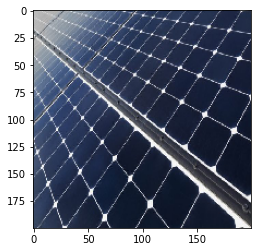

Solar Cell is Not fault


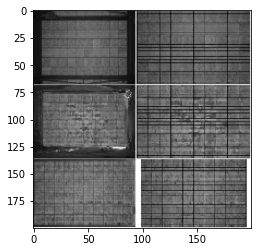

Solar Cell is Fault


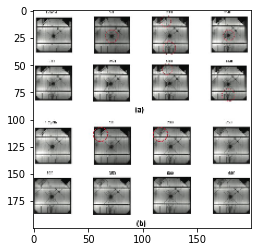

Solar Cell is Fault


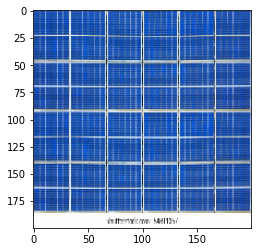

Solar Cell is Not fault


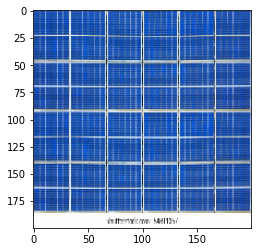

Solar Cell is Not fault


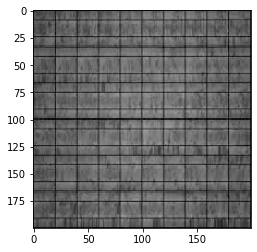

Solar Cell is Fault


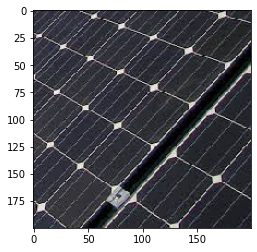

Solar Cell is Fault


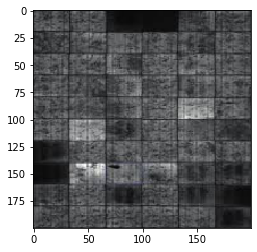

Solar Cell is Fault


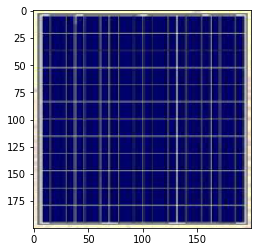

Solar Cell is Not fault


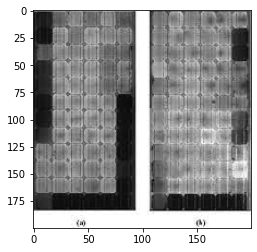

Solar Cell is Fault


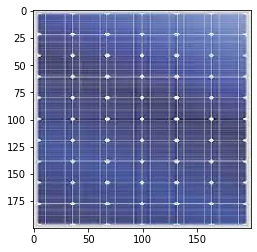

Solar Cell is Not fault


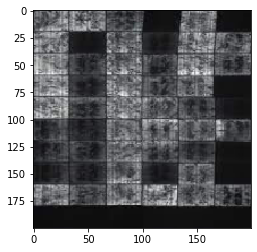

Solar Cell is Fault


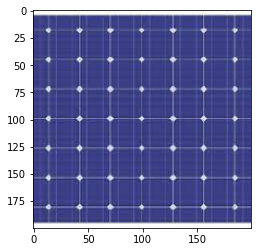

Solar Cell is Not fault


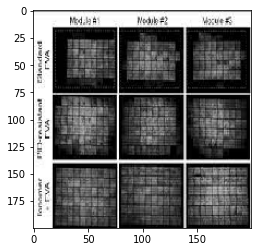

Solar Cell is Fault


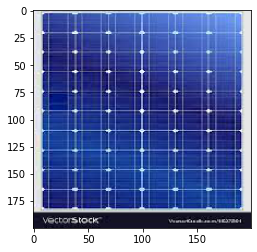

Solar Cell is Not fault


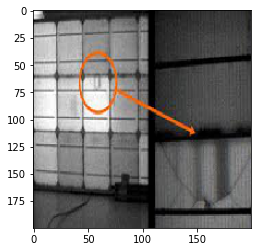

Solar Cell is Fault


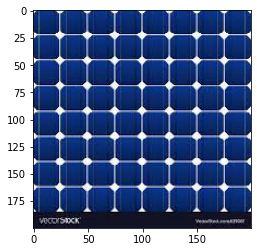

Solar Cell is Not fault


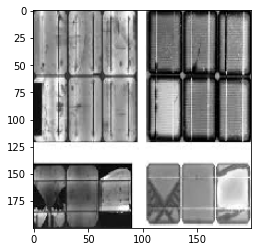

Solar Cell is Fault


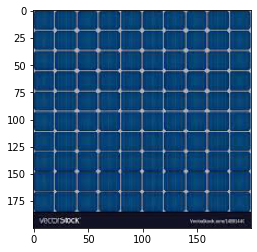

Solar Cell is Not fault


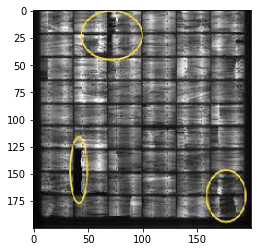

Solar Cell is Fault


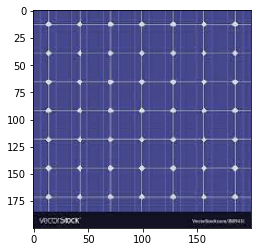

Solar Cell is Not fault


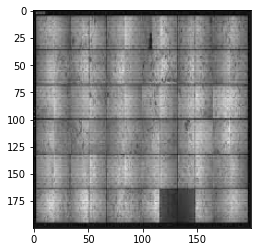

Solar Cell is Fault


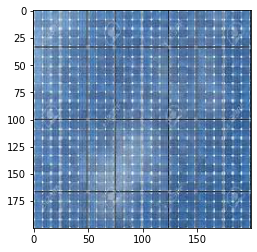

Solar Cell is Not fault


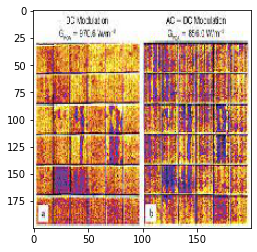

Solar Cell is Fault


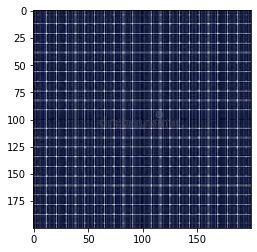

Solar Cell is Not fault


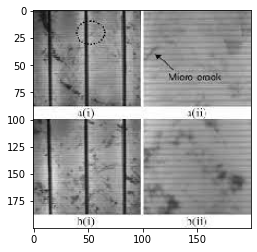

Solar Cell is Fault


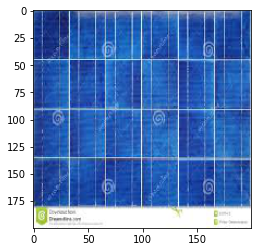

Solar Cell is Not fault


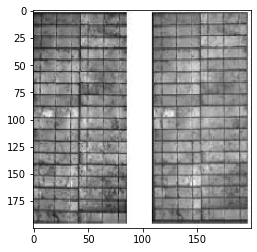

Solar Cell is Fault


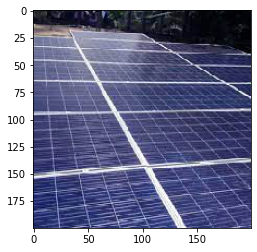

Solar Cell is Not fault


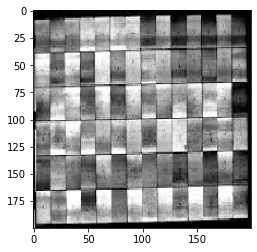

Solar Cell is Fault


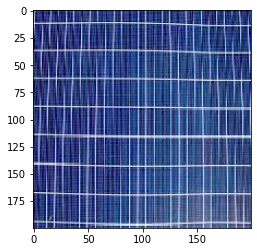

Solar Cell is Not fault


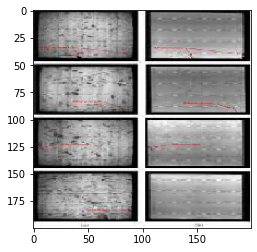

Solar Cell is Fault


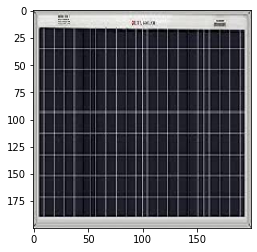

Solar Cell is Not fault


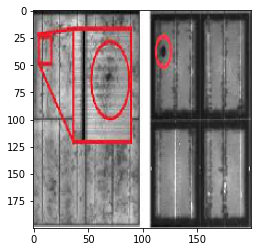

Solar Cell is Fault


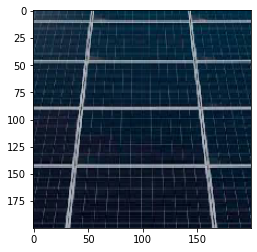

Solar Cell is Not fault


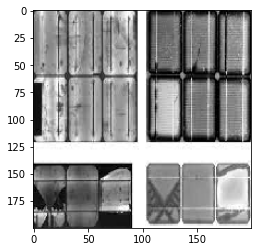

Solar Cell is Fault


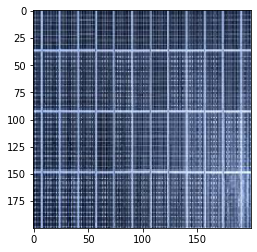

Solar Cell is Not fault


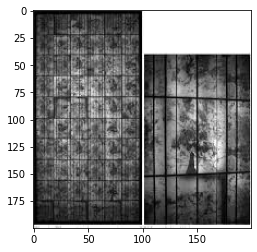

Solar Cell is Fault


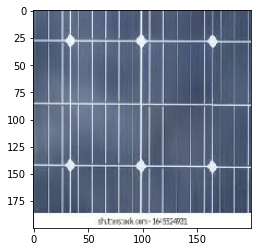

Solar Cell is Not fault


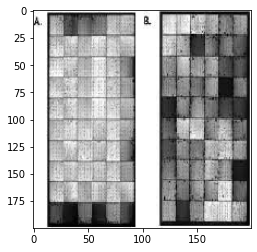

Solar Cell is Fault


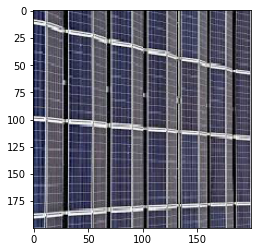

Solar Cell is Not fault


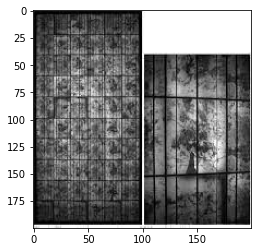

Solar Cell is Fault


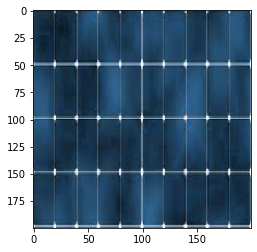

Solar Cell is Not fault


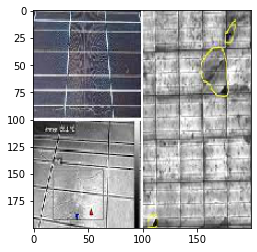

Solar Cell is Fault


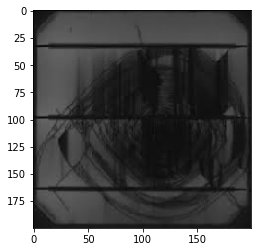

Solar Cell is Fault


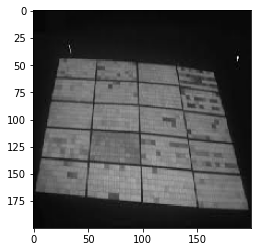

Solar Cell is Fault


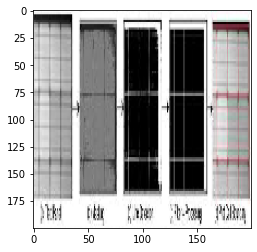

Solar Cell is Fault


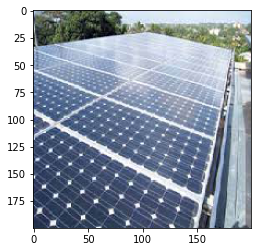

Solar Cell is Not fault


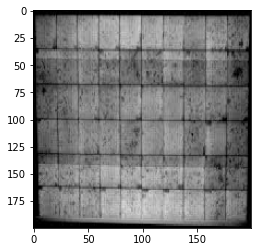

Solar Cell is Fault


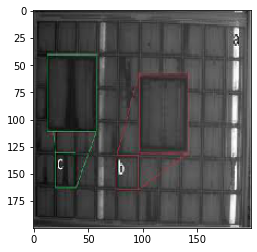

Solar Cell is Fault


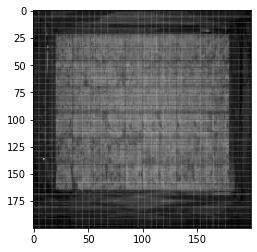

Solar Cell is Fault


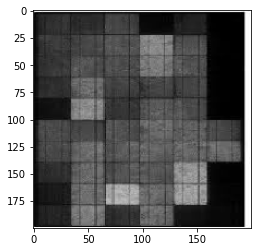

Solar Cell is Fault


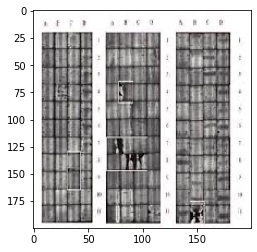

Solar Cell is Fault


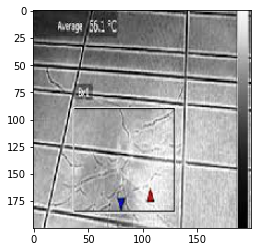

Solar Cell is Fault


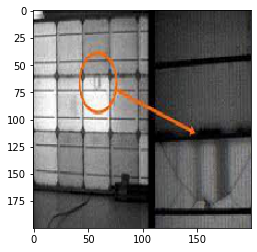

Solar Cell is Fault


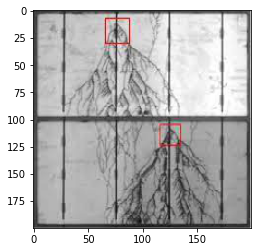

Solar Cell is Fault


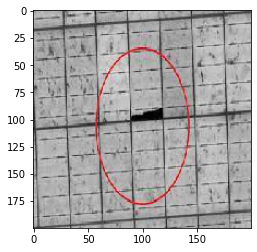

Solar Cell is Fault


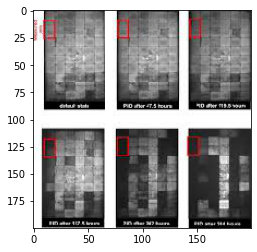

Solar Cell is Fault


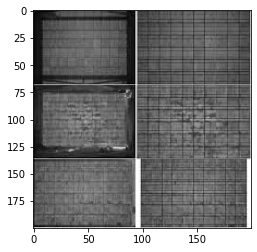

Solar Cell is Fault


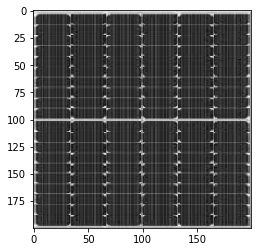

Solar Cell is Not fault


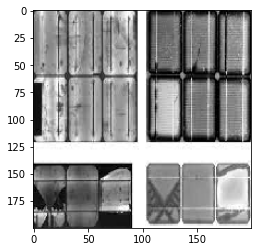

Solar Cell is Fault


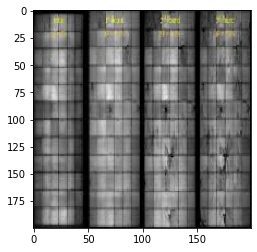

Solar Cell is Fault


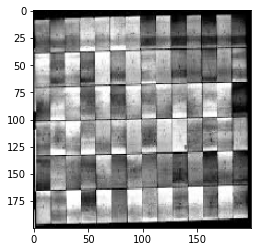

Solar Cell is Fault


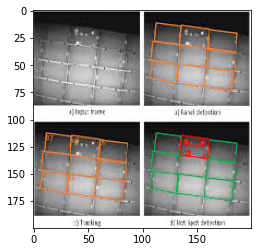

Solar Cell is Fault


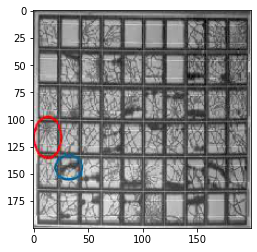

Solar Cell is Fault


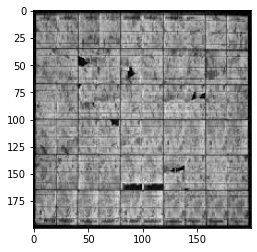

Solar Cell is Fault


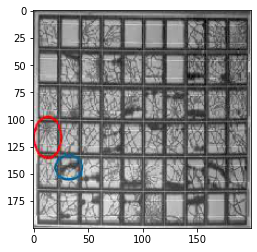

Solar Cell is Fault


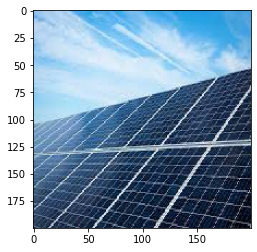

Solar Cell is Not fault


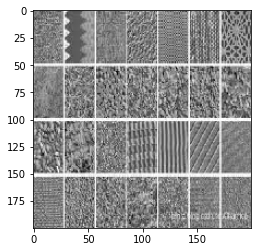

Solar Cell is Fault


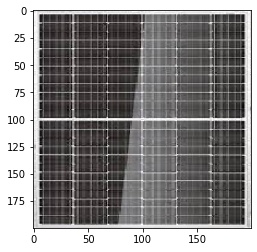

Solar Cell is Not fault


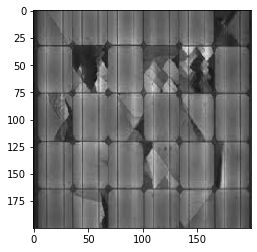

Solar Cell is Fault


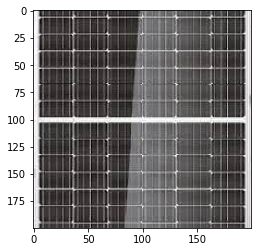

Solar Cell is Not fault


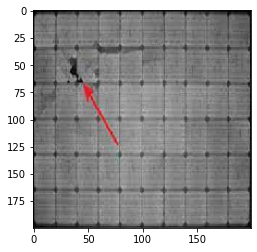

Solar Cell is Fault


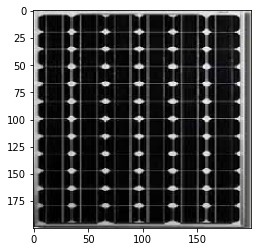

Solar Cell is Not fault


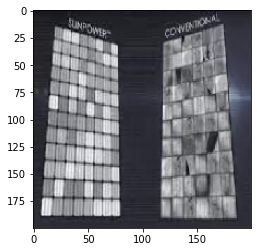

Solar Cell is Fault


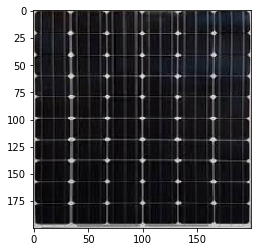

Solar Cell is Not fault


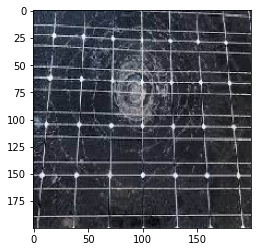

Solar Cell is Fault


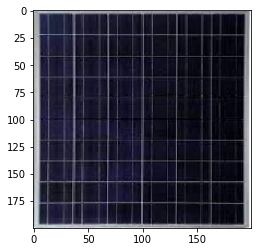

Solar Cell is Not fault


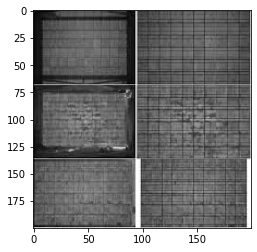

Solar Cell is Fault


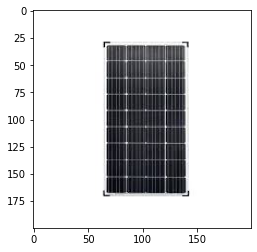

Solar Cell is Not fault


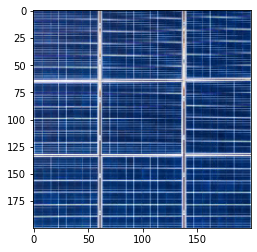

Solar Cell is Not fault


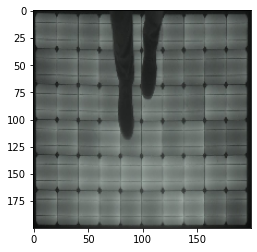

Solar Cell is Fault


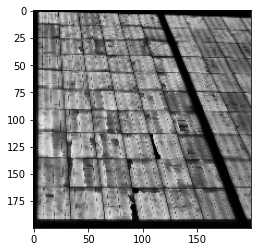

Solar Cell is Fault


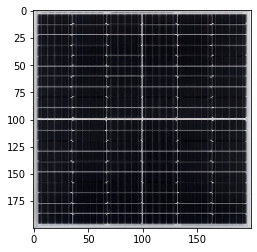

Solar Cell is Not fault


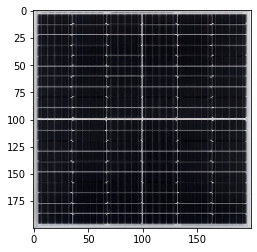

Solar Cell is Not fault


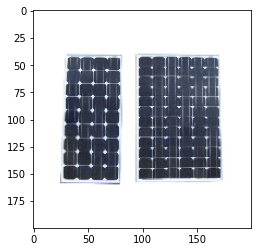

Solar Cell is Not fault


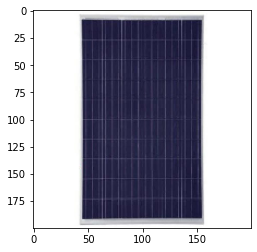

Solar Cell is Not fault


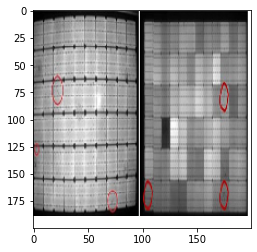

Solar Cell is Fault


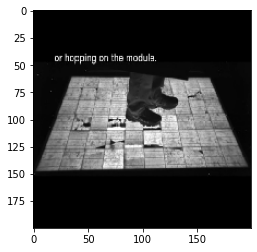

Solar Cell is Fault


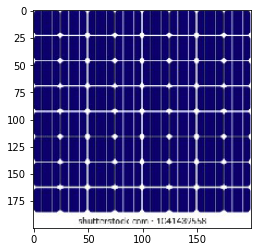

Solar Cell is Not fault


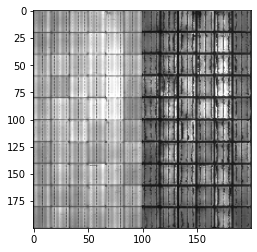

Solar Cell is Fault


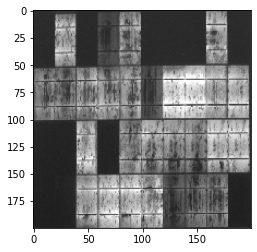

Solar Cell is Fault


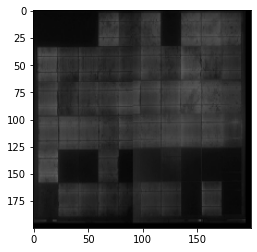

Solar Cell is Fault


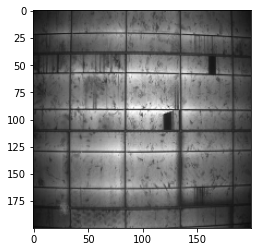

Solar Cell is Fault


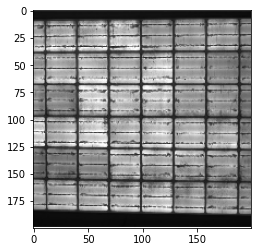

Solar Cell is Fault


In [15]:
dir_path = 'D:/Project 91/test'

for i in os.listdir(dir_path):
    img = image.load_img(dir_path+'//'+ i,target_size=(200,200))
    plt.imshow(img)
    plt.show()
    
    X = image.img_to_array(img)
    X = np.expand_dims(X,axis=0)
    images = np.vstack([X])
    
    val= model.predict(images)
    if val == 0:
        print("Solar Cell is Fault")
    else:
        print("Solar Cell is Not fault")
    